#**Deteksi Sarkasme di Berita Utama**

Jurnalisme elektronik yang didukung oleh media sosial telah menjadi salah satu sumber utama konsumsi informasi akhir-akhir ini. Banyak rumah media menggunakan cara-cara kreatif untuk memanfaatkan peningkatan penayangan pada postingan. Salah satu caranya adalah menggunakan tajuk sarkastik sebagai umpan klik. Sebuah model yang mampu memprediksi apakah suatu berita utama bersifat sarkastik atau tidak dapat berguna bagi rumah media untuk menganalisis pendapatan triwulanan mereka berdasarkan strategi. Selain itu, dari sudut pandang pembaca, mesin telusur dapat memanfaatkan informasi sarkasme ini dan bergantung pada preferensi pembaca, merekomendasikan artikel serupa kepada mereka. Tujuannya adalah membangun model untuk mendeteksi apakah suatu kalimat sarkastik atau tidak, menggunakan Bidirectional LSTM.

Kumpulan data News Headlines untuk Deteksi Sarkasme Kumpulan data dikumpulkan dari dua situs web berita, theonion.com dan huffingtonpost.com . Studi sebelumnya dalam Deteksi Sarkasme sebagian besar menggunakan kumpulan data Twitter yang dikumpulkan menggunakan pengawasan berbasis tagar tetapi kumpulan data tersebut berisik dalam hal label dan bahasa. Selain itu, banyak tweet adalah balasan untuk tweet lain dan mendeteksi sarkasme di dalamnya membutuhkan ketersediaan tweet kontekstual. Kumpulan data baru ini memiliki keunggulan sebagai berikut dibandingkan kumpulan data Twitter yang ada: Karena tajuk berita ditulis oleh para profesional secara formal, tidak ada kesalahan ejaan dan penggunaan informal. Ini mengurangi ketersebaran dan juga meningkatkan kemungkinan menemukan embeddings yang telah dilatih sebelumnya. Adapun Dataset yang digunakan pada projek ini dapat diakses pada link berikut: https://www.kaggle.com/datasets/rmisra/news-headlines-dataset-for-sarcasm-detection  

Selain itu, karena satu-satunya tujuan TheOnion adalah untuk menerbitkan berita sarkastik, kami mendapatkan label berkualitas tinggi dengan kebisingan yang jauh lebih sedikit dibandingkan dengan kumpulan data Twitter. Berbeda dengan tweet yang membalas tweet lainnya, headline berita yang didapatkan bersifat self-contained. Ini akan membantu kami dalam memisahkan elemen sarkastik yang sebenarnya.

Setiap record terdiri dari tiga atribut:

- is_sarcastic : 1 if the record is sarcastic otherwise 0

- headline : the headline of the news article

- article_link : link to the original news article. Useful in collecting supplementary data.

##**Import Library**

In [23]:
import numpy as np
import pandas as pd 
import os
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Embedding, Flatten
from tensorflow.keras.callbacks import EarlyStopping
from bs4 import BeautifulSoup

##**Upload Dataset**

In [24]:
from google.colab import files
files.upload()

Saving Sarcasm_Headlines_Dataset.json to Sarcasm_Headlines_Dataset (1).json


{'Sarcasm_Headlines_Dataset.json': b'{"article_link": "https://www.huffingtonpost.com/entry/versace-black-code_us_5861fbefe4b0de3a08f600d5", "headline": "former versace store clerk sues over secret \'black code\' for minority shoppers", "is_sarcastic": 0}\r\n{"article_link": "https://www.huffingtonpost.com/entry/roseanne-revival-review_us_5ab3a497e4b054d118e04365", "headline": "the \'roseanne\' revival catches up to our thorny political mood, for better and worse", "is_sarcastic": 0}\r\n{"article_link": "https://local.theonion.com/mom-starting-to-fear-son-s-web-series-closest-thing-she-1819576697", "headline": "mom starting to fear son\'s web series closest thing she will have to grandchild", "is_sarcastic": 1}\r\n{"article_link": "https://politics.theonion.com/boehner-just-wants-wife-to-listen-not-come-up-with-alt-1819574302", "headline": "boehner just wants wife to listen, not come up with alternative debt-reduction ideas", "is_sarcastic": 1}\r\n{"article_link": "https://www.huffingt

##**Read Dataset**

Membaca dataset dengan menggunakan library pandas

In [25]:
# Load the JSON file
df = pd.read_json("/content/Sarcasm_Headlines_Dataset.json", lines=True)

Menggunakan df.info untuk mengetahui kondisi dataset yang digunakan, yangmana terdiri dari 3 kolom yang terdiri dari article_link, headline, dan is_sarcastic.

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26709 entries, 0 to 26708
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   article_link  26709 non-null  object
 1   headline      26709 non-null  object
 2   is_sarcastic  26709 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 626.1+ KB


##**Countplot of Target feature**

Selanjutnya memvisualisasikan dataset dengan menampilkan is_sarcastic yang terdiri dari 2 kategori, dimana 0 berarti bukan sarcastic dankategori 1 yang berarti sarcastic

<Axes: xlabel='is_sarcastic', ylabel='count'>

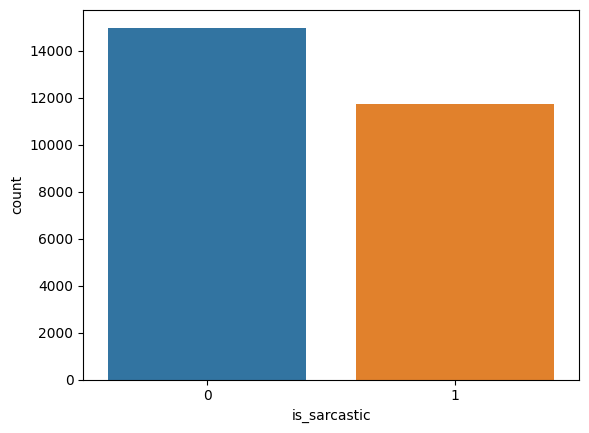

In [27]:
sns.countplot(x='is_sarcastic',data=df)

Untuk mengetahui apakah ada data yang kosong maka dapat diketahui dengan perintah df.isna()

In [28]:
df.isna().sum()

article_link    0
headline        0
is_sarcastic    0
dtype: int64

Dari perintah tersebut dapat diketahui bahwa tidak terdapat data kosong

Selanjutnya kolom article_link akan dihapus karena kurang bermanfaat, untuk menghapus kolom article_link maka dapat menggunakan perintah di bawah ini.

In [29]:
del df['article_link'] # Menghapus kolom ini karena tidak ada gunanya

Import library-library yang akan digunakan 

In [30]:
import re  
import matplotlib.pyplot as plt  
from wordcloud import WordCloud, STOPWORDS  

##**Word Cloud of headline that is Not Sarcastic**

Untuk mengetahui dan menampilkan sebaran data not sarcastic pada dataset maka dapt memvisualisasikan dengan word cloud seperti di bawah ini.

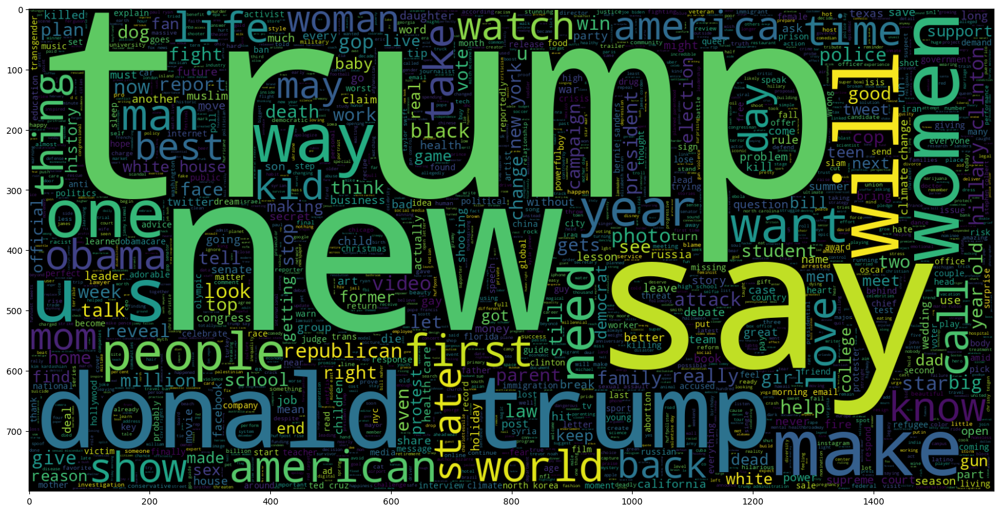

In [31]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.is_sarcastic == 0].headline))
plt.imshow(wc , interpolation = 'bilinear')

##**Word Cloud of headline that is Sarcastic**

Untuk mengetahui dan menampilkan sebaran data yang sarcastic pada dataset maka dapt memvisualisasikan dengan word cloud seperti di bawah ini.

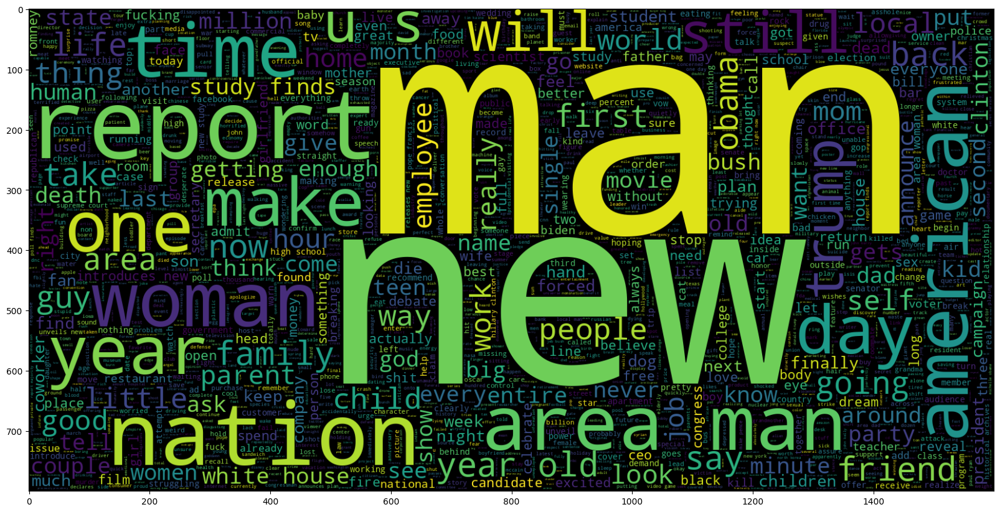

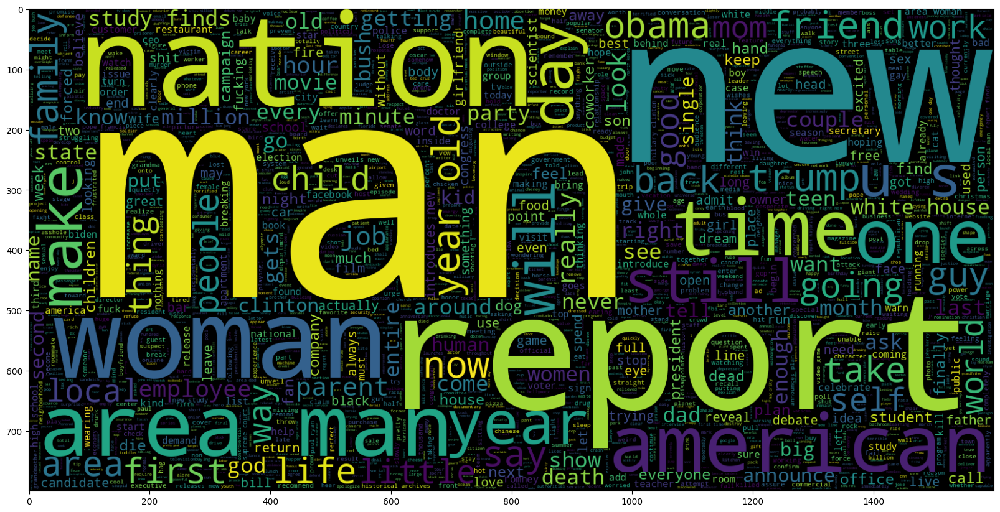

In [32]:
plt.figure(figsize = (20,20)) # Text that is Sarcastic
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.is_sarcastic == 1].headline))
plt.imshow(wc , interpolation = 'bilinear')
plt.figure(figsize = (20,20)) # Text that is Sarcastic
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(df[df.is_sarcastic == 1].headline))
plt.imshow(wc , interpolation = 'bilinear')

In [33]:
df.head(n = 10).style.background_gradient(cmap = "summer")


,headline,is_sarcastic
0,former versace store clerk sues over secret 'black code' for minority shoppers,0
1,"the 'roseanne' revival catches up to our thorny political mood, for better and worse",0
2,mom starting to fear son's web series closest thing she will have to grandchild,1
3,"boehner just wants wife to listen, not come up with alternative debt-reduction ideas",1
4,j.k. rowling wishes snape happy birthday in the most magical way,0
5,advancing the world's women,0
6,the fascinating case for eating lab-grown meat,0
7,"this ceo will send your kids to school, if you work for his company",0
8,top snake handler leaves sinking huckabee campaign,1
9,friday's morning email: inside trump's presser for the ages,0


##**Visualization of characters in text**

Untuk menampilkan karakter pada text berdasarkan dataset yang telah digunakan maka dapat digunakan perintah sebagai berikut.

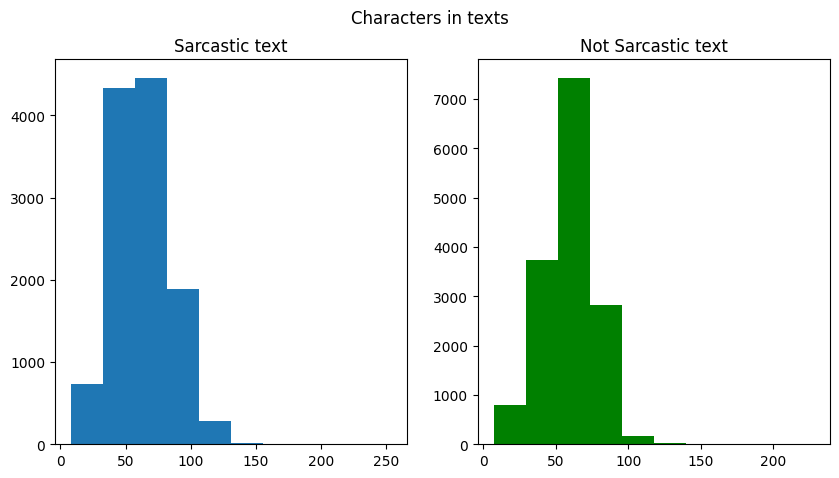

In [34]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
text_len=df[df['is_sarcastic']==1]['headline'].str.len()
ax1.hist(text_len)
ax1.set_title('Sarcastic text')
text_len=df[df['is_sarcastic']==0]['headline'].str.len()
ax2.hist(text_len, color='green')
ax2.set_title('Not Sarcastic text')
fig.suptitle('Characters in texts')
plt.show()

##**Visualization of words in texts**

Untuk menampilkan kata-kata pada text berdasarkan dataset yang telah digunakan maka dapat digunakan perintah sebagai berikut.

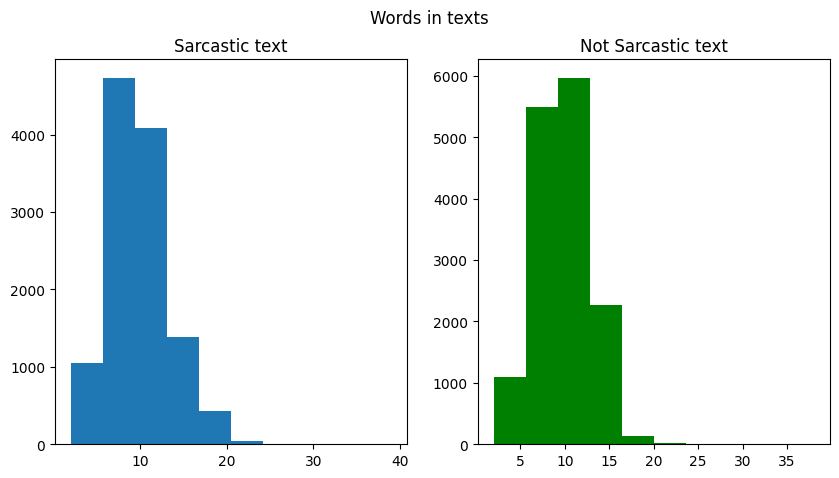

In [35]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
text_len=df[df['is_sarcastic']==1]['headline'].str.split().map(lambda x: len(x))
ax1.hist(text_len)
ax1.set_title('Sarcastic text')
text_len=df[df['is_sarcastic']==0]['headline'].str.split().map(lambda x: len(x))
ax2.hist(text_len,color='green')
ax2.set_title('Not Sarcastic text')
fig.suptitle('Words in texts')
plt.show()

##**Visualization of average word length in each text**

Untuk menegtahui dan menampilkan Visualisasi panjang kata rata-rata di setiap teks dapat menggunkan perintah sebagai berikut

<ipython-input-36-5318300728a1>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1)
<ipython-input-36-5318300728a1>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='green')


Text(0.5, 0.98, 'Average word length in each text')

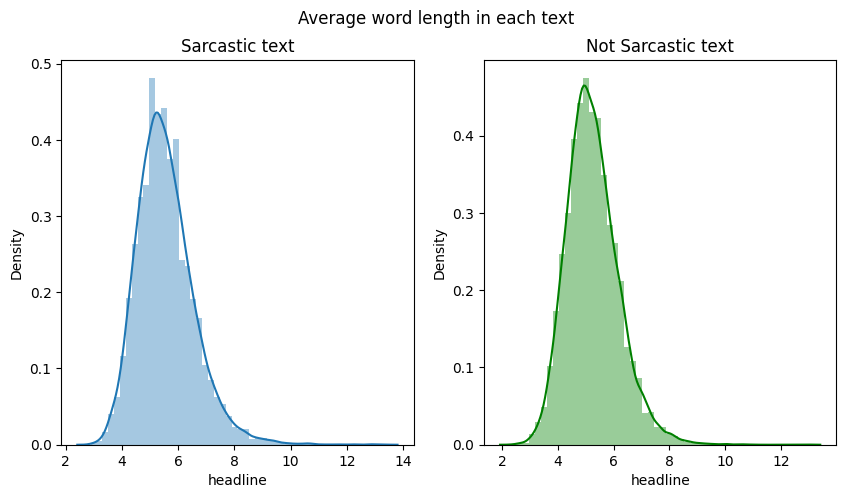

In [36]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
word=df[df['is_sarcastic']==1]['headline'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1)
ax1.set_title('Sarcastic text')
word=df[df['is_sarcastic']==0]['headline'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='green')
ax2.set_title('Not Sarcastic text')
fig.suptitle('Average word length in each text')

##**Splitting the dataset**

*Membagi* dataset menjadi data training dan data testing, dengan perbandingan 70:30, adapun perintahnya adalah sebgaia berikut

In [37]:
from sklearn.model_selection import train_test_split
X=df['headline'].values
y=df['is_sarcastic'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
vocab_size=10000
embedding_dim=16    
max_length=32
trunc_type='post'
padding_type='post'
oov_tok='<oov>'

##**Preprocessing the dataset**

Selanjutnya untuk preprocessing dataset maka dapat menggunakan tokenizer yang diimport melalui library tersorflow

In [38]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer= Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(X_train)

word_index=tokenizer.word_index

training_sequences=tokenizer.texts_to_sequences(X_train)
training_padded=pad_sequences(training_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

testing_sequences=tokenizer.texts_to_sequences(X_test)
testing_padded=pad_sequences(testing_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

##**Initializing the model**

Membangun model arsitektur sekuensial deep learning dengan menggunakan TensorFlow sebagai berikut, menggunakan embedding, dropout, learning rate, lalu menentukan optimizer, metrik dan los.

In [39]:
model = Sequential()
model.add(Embedding(vocab_size, embedding_dim, input_length=max_length))
model.add(Flatten())

model.add(Dense(units=32,activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(units=10,activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(units=1,activation='sigmoid'))

opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 32, 16)            160000    
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 32)                16416     
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_4 (Dense)             (None, 10)                330       
                                                                 
 dropout_3 (Dropout)         (None, 10)                0         
                                                                 
 dense_5 (Dense)             (None, 1)                

Menggunakan early stooping callbacks agar proses training dapat berhenti ketika model sudah mencapai model yang fit

In [40]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

##**Training the model with Early stopping**

Untuk melakukan training model yang sudah dibuat sebelumnya, maka dapat menggunakan perintah sebagai berikut, dimana menggunakan batch size sebesar 256 dan epoch 100

In [41]:
model_1 = model.fit(x=training_padded, y=y_train, batch_size=256, epochs=100,
          validation_data=(testing_padded, y_test),
          verbose=1,
          callbacks=[early_stop])

Epoch 1/100
74/74 [==============================] - 2s 10ms/step - loss: 0.6908 - accuracy: 0.5271 - val_loss: 0.6878 - val_accuracy: 0.5547
Epoch 2/100
74/74 [==============================] - 1s 7ms/step - loss: 0.6874 - accuracy: 0.5523 - val_loss: 0.6855 - val_accuracy: 0.5546
Epoch 3/100
74/74 [==============================] - 1s 7ms/step - loss: 0.6852 - accuracy: 0.5581 - val_loss: 0.6839 - val_accuracy: 0.5546
Epoch 4/100
74/74 [==============================] - 1s 8ms/step - loss: 0.6833 - accuracy: 0.5598 - val_loss: 0.6820 - val_accuracy: 0.5546
Epoch 5/100
74/74 [==============================] - 1s 8ms/step - loss: 0.6810 - accuracy: 0.5634 - val_loss: 0.6787 - val_accuracy: 0.5547
Epoch 6/100
74/74 [==============================] - 0s 7ms/step - loss: 0.6747 - accuracy: 0.5752 - val_loss: 0.6706 - val_accuracy: 0.5621
Epoch 7/100
74/74 [==============================] - 1s 8ms/step - loss: 0.6650 - accuracy: 0.5961 - val_loss: 0.6565 - val_accuracy: 0.6079
Epoch 8/100


##**Evaluating the model**

Lalu diperoleh hasil evaluasi model sebagai berikut

In [42]:
score = model.evaluate(testing_padded, y_test, batch_size=64, verbose=1)
print('Test accuracy:', score[1])

126/126 [==============================] - 0s 2ms/step - loss: 0.3218 - accuracy: 0.8666
Test accuracy: 0.8665918111801147


##Kesimpulan
Kami mendapatkan tes akurasi 86% yang cukup bagus dengan kerugian 0,32. Kami dapat lebih meningkatkan model kami menggunakan lapisan yang lebih kompleks. Mempertimbangkannya sebagai model dasar maka perlu dioptimalkan lebih lanjut untuk mendapatkan kinerja yang lebih baik.